Workflow:
1. Import module and global settings
2. Place for reusable custom functions
3. Reading treadmill behavior csv files
4. Exract speed, lick event
5. Calculate COM of Lick from RZ
5. Transformation of data structure for statistics and visualization
6. Statistics
7. Visualization

In [1]:
# Import module and global settings

# Import modules
import dabest
import os
import re
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from tkinter import Tk, filedialog

# Global settings
RZFLOOR = 150 #cm
RZCEILING = 170 #cm
LICK_START_CUTOFF = 30 #cm
BINNING_WINDOW = 1 #cm or min 

root = Tk()
root.attributes('-topmost', True)  # 將主視窗設置為最上層
root.withdraw()

''

In [3]:
# Place for reusable custom functions

#select file
def select_files_and_get_paths(prompt = "select behavior csv files"):
    """
    Prompt the user to select multiple files using a GUI.

    Parameters:
    prompt (str): The prompt message to display in the file dialog.

    Returns:
    tuple: A tuple containing the paths of the selected files.
    """

    file_paths = []

    while True:

        files = filedialog.askopenfilenames(parent=root, title=prompt, filetypes=[('CSV files', '*.csv')])
        
        if not files:
            break
        file_paths.extend(files)

    return file_paths

# Extract the experiment information from the file path
def extract_experiment_info(file_path):
    """
    Extract experiment condition, Genotype, and mouse ID from the file path.

    Parameters:
    file_path (str): The path to the file.

    Returns:
    tuple: A tuple containing the experiment condition (Treatment), Genotype, and mouse ID.
    """
    # Normalize the file path to use `/` as the separator
    normalized_path = file_path.replace("\\", "/")
    
    # Match the file path using the updated regex
    match = re.search(
    r'/([^/]+)/'                 # 匹配目錄層級，例如 'im(Proximal limb muscles)180/'
    r'(?P<Genotype>[^/]+)_'      # 匹配 genotype，例如 'PVLMO3'
    r'(?P<Treatment>[^/]+)/'       # 匹配 Treatment，例如 'Baseline' 或 'CTZ'
    r'(?P<mouse_id>[A-Z0-9]+)_'  # 匹配 mouse_id，例如 '1PL001F'
    , normalized_path)

    if match:
        Treatment = match.group('Treatment')
        Genotype = match.group('Genotype')
        mouse_id = match.group('mouse_id')
        return Treatment, Genotype, mouse_id
    else:
        print(f"No valid experiment info found in file path: {file_path}")
        return None, None, None

#read file
def read_file(file_paths):
    """
    Read multiple CSV files and return a dictionary with experiment info as keys and DataFrame as values.

    Parameters:
    file_paths: A tuple containing the paths of the selected files.

    Returns:
    dict: A dictionary where keys are (Treatment, Genotype, mouse_id) tuples and values are DataFrames.
    """
    behavior_csv_data = {}

    for file_path in file_paths:
        # Extract experiment information
        Treatment, Genotype, mouse_id = extract_experiment_info(file_path)

        if Treatment is None or Genotype is None or mouse_id is None:
            print(f"Skipping file due to missing experiment info: {file_path}")
            continue

        # Read the CSV file into a DataFrame
        try:
            df = pd.read_csv(file_path)
        except Exception as e:
            print(f"Error reading file {file_path}: {e}")
            continue

        # Add the DataFrame to the dictionary
        key = (Treatment, Genotype, mouse_id)
        
        behavior_csv_data[key] = df

    return behavior_csv_data

# Exract avg speed in a session
def session_avg_speed(df):
    """
    Extract the average speed from the DataFrame.

    Parameters:
    df (DataFrame): The DataFrame containing the behavior data.

    Returns:
    float: The average speed.
    """
    # 將 df 依trial number分組
    grouped = df.groupby(df.columns[1])

    # 找到每一Trial中速度的最大值
    max_values = grouped[df.columns[3]].max()

    #去除異常值
    max_values = max_values[max_values < 100]

    # 將每一Trial中速度的最大值相加後平均
    avg_max = max_values.mean()

    # 返回這個平均值
    return avg_max

def extract_lick_positions(df, lick_start_cutoff=LICK_START_CUTOFF, RzFloor=RZFLOOR, RzCeiling=RZCEILING):
    """
    Extract lick positions (cm) from the DataFrame, applying optional reward zone filtering.

    Parameters:
    df (DataFrame): Input behavior data containing lick events, positions, and times.
    lick_start_cutoff (float): Minimum position (cm) for valid licks. Default is 0.
    RzFloor (float, optional): Lower boundary of the reward zone. If None, no reward zone filtering is applied.
    RzCeiling (float, optional): Upper boundary of the reward zone. If None, no upper limit is applied.

    Returns:
    DataFrame: A DataFrame with columns for 'lick_position', 'trial', and 'lick_time'.
    """
    # Step 0: Ensure no NaN values and validate data types
    required_columns = [0, 1, 2, 3, 4]  # Assuming time, trial number, position (cm), time (lick event), and lick number columns
    if any(col >= len(df.columns) for col in required_columns):
        raise ValueError("Input DataFrame does not have the required columns.")

    df = df.copy().dropna()
    for col in required_columns:
        if not pd.api.types.is_numeric_dtype(df[df.columns[col]]):
            raise ValueError(f"Column {df.columns[col]} must be numeric.")

    # Step 1: Identify lick events where the lick number increases
    df['prev_lick_number'] = df[df.columns[4]].shift(1)  # Assuming column 4 is lick number
    df['lick_happened'] = df[df.columns[4]] > df['prev_lick_number']
    df['lick_happened'] = df['lick_happened'].fillna(False)

    # Extract positions and times where licks happen
    df['lick_position'] = df.loc[df['lick_happened'], df.columns[2]]  # Assuming column 2 is position (cm)
    df['lick_time'] = df.loc[df['lick_happened'], df.columns[0]]  # Assuming column 0 is time

    # Step 2: Filter out licks below lick_start_cutoff
    valid_positions = df['lick_position'] > lick_start_cutoff

    # Step 3: Apply reward zone filtering if specified
    if RzFloor is not None:
        valid_positions &= df['lick_position'] < RzFloor

    # Apply combined filters
    df['lick_position'] = df['lick_position'].where(valid_positions)
    df['lick_time'] = df['lick_time'].where(valid_positions)

    # Step 4: Add the first lick position and time in the reward zone for each trial
    if RzFloor is not None and RzCeiling is not None:
        # Get the first lick position and time in the reward zone for each trial
        first_lick_in_reward_zone = (
            df[(df[df.columns[2]] >= RzFloor) & (df[df.columns[2]] <= RzCeiling)]
            .groupby(df.columns[1])[[df.columns[2], df.columns[0]]]
            .first()
            .dropna()
        )

        # Create a DataFrame for reward zone licks
        reward_zone_licks = pd.DataFrame({
            df.columns[1]: first_lick_in_reward_zone.index,  # Trial number
            'lick_position': first_lick_in_reward_zone[df.columns[2]].values,  # Lick position
            'lick_time': first_lick_in_reward_zone[df.columns[0]].values  # Lick time
        })

        # Combine original lick positions/times with reward zone licks
        df = pd.concat([
            df[['lick_position', 'lick_time', df.columns[1]]].dropna(),  # Keep original licks
            reward_zone_licks  # Add reward zone licks
        ]).drop_duplicates().reset_index(drop=True)

    # Step 5: Keep only the 'lick_position', 'trial', and 'lick_time' columns
    lick_position_df = df.sort_values(by=[df.columns[1], 'lick_position']).copy()
    lick_position_df.columns = ['lick_position', 'lick_time', 'trial']  # Rename columns for clarity
    lick_position_df['lick_position'] = lick_position_df['lick_position'].astype(float)
    lick_position_df['lick_time'] = lick_position_df['lick_time'].astype(float)

    return lick_position_df


def licks_statistics(lick_position_df):
    """
    Calculate lick statistics from the DataFrame.

    Parameters:
    lick_position_df (DataFrame): Input licks data of one Treatment containing columns:
                                  'trial' and 'lick_position'.

    Returns:
    lick_stats (DataFrame): A DataFrame containing statistics for each trial:
                            - 'trial': Trial number
                            - 'phase': PreTX(Trial~30), PostTX(Trial31~60)
                            - 'COM': Center of Mass (mean of lick positions)
                            - 'std_within_trial': std of lick positions)
    """
    # Ensure no NaN values in the input data
    lick_position_df = lick_position_df.dropna()

    # Group by trial to calculate statistics
    grouped = lick_position_df.groupby('trial')

    # Calculate Center of Mass (mean of lick positions)
    com = grouped['lick_position'].mean()

    # COM Distance from Reward Zone
    com_distance = RZFLOOR - com

    # Calculate std 
    std = grouped['lick_position'].std()
    
    

    # Create the statistics DataFrame
    lick_stats = pd.DataFrame({
        'trial': com.index,
        'COM': com.values,
        'COM_distance_from_RZ': com_distance.values,
        'std_within_trial': std.values
    })

    lick_stats['phase'] = lick_stats['trial'].apply(
    lambda x: 'PreTX' if 1 <= x <= 30 else ('PostTX' if 31 <= x else None))

    return lick_stats

def convert_to_group_lick_stats(ind_lick_stats_data):
    """
    Convert ind_lick_stats_data to group_lick_stats_data, a long-format DataFrame suitable for dabest analysis.

    Steps:
    1. Remove rows with 'phase' == None.
    2. Group by 'PreTX' and 'PostTX' phases, calculate the average values for each group.
    3. Add 'std_between_trial' based on 'COM_distance_from_RZ'.
    4. Flatten the keys in ind_lick_stats_data and add columns 'group' and 'mouse_id'.
    5. Format the final DataFrame for dabest compatibility.

    Parameters:
    ind_lick_stats_data (dict): Input data with keys as (Treatment, Genotype, mouse_id) and values as DataFrames.

    Returns:
    group_lick_stats_data (DataFrame): A long-format DataFrame for analysis.
    """
    # Step 1: Prepare an empty list to store the processed data
    group_stats_list = []

    # Step 2: Iterate through ind_lick_stats_data
    for (Treatment, Genotype, mouse_id), stats_list in ind_lick_stats_data.items():
        for stats_df in stats_list:
            # Remove rows where 'phase' is None
            stats_df = stats_df[stats_df['phase'].notna()]

            # Group by 'phase' (PreTX, PostTX)
            grouped = stats_df.groupby('phase')

            for phase, group in grouped:
                # Calculate mean values for each group
                mean_com = group['COM'].mean()
                mean_distance = group['COM_distance_from_RZ'].mean()
                mean_std_within = group['std_within_trial'].mean()

                # Calculate std_between_trial (std of COM_distance_from_RZ)
                std_distance = group['COM_distance_from_RZ'].std()
                

                # Create a new record for each group
                group_stats_list.append({
                    'group': f"{Genotype}_{Treatment}_{phase}",  # Combine Treatment and Genotype
                    'mouse_id': mouse_id,
                    'COM of Lick': mean_com,
                    'COM of Lick form RZ': mean_distance,
                    'std within trial': mean_std_within,
                    'std between trial': std_distance
                })

    # Step 3: Convert the list of dictionaries to a DataFrame
    group_lick_stats_data = pd.DataFrame(group_stats_list)

    return group_lick_stats_data

def calculate_behavior_delta(group_lick_stats_data):
    """
    Calculate the difference in behavior measurements between PreTX and PostTX 
    for the same Genotype, Treatment, and mouse.

    Parameters:
    group_lick_stats_data (pd.DataFrame): A DataFrame containing the lick statistics for each trial.
                                          Required columns: 'group', 'mouse_id', 
                                          'mean_COM', 'mean_COM_distance_from_RZ',
                                          'mean_std_within_trial', 
                                          'std_of_COMs_between_trial'.
                                          
    Returns:
    pd.DataFrame: A DataFrame containing the differences in behavior measurements 
                  between PreTX and PostTX for each Genotype, Treatment, and mouse.
                  Columns: 'Genotype', 'Treatment', 'mouse_id', 'ΔCOM of Lick', 
                  'ΔCOM of Lick form RZ', 'Δstd within trial',
                  'Δstd between trial'.
    """
    # 分割 'group' 成 Genotype, Treatment 和 Tx
    group_lick_stats_data[['Genotype', 'Treatment', 'Tx']] = group_lick_stats_data['group'].str.rsplit('_', n=2, expand=True)
    
    # 檢查 PreTX 和 PostTX 的完整性
    pretx_count = group_lick_stats_data[group_lick_stats_data['Tx'] == 'PreTX'].shape[0]
    posttx_count = group_lick_stats_data[group_lick_stats_data['Tx'] == 'PostTX'].shape[0]
    if pretx_count != posttx_count:
        print(f"Warning: Mismatched PreTX ({pretx_count}) and PostTX ({posttx_count}) records.")
    
    # Pivot 將 PreTX 和 PostTX 的值分開
    pivoted = group_lick_stats_data.pivot_table(
        index=['Genotype', 'Treatment', 'mouse_id'], 
        columns='Tx', 
        values=['COM of Lick', 'COM of Lick form RZ', 'std within trial', 'std between trial']
    ).reset_index()
    
    # Flatten 多層列標籤
    pivoted.columns = ['_'.join(col).strip('_') for col in pivoted.columns.values]

    # 檢查是否存在 NaN 值，確保 PreTX 和 PostTX 都存在
    missing_pretx = pivoted['COM of Lick_PreTX'].isna().sum()
    missing_posttx = pivoted['COM of Lick_PostTX'].isna().sum()
    if missing_pretx > 0 or missing_posttx > 0:
        print(f"Warning: Missing PreTX ({missing_pretx}) or PostTX ({missing_posttx}) records after pivot.")

    # 計算 delta（PostTX - PreTX）
    pivoted['ΔCOM of Lick'] = pivoted['COM of Lick_PostTX'] - pivoted['COM of Lick_PreTX']
    pivoted['ΔCOM of Lick form RZ'] = pivoted['COM of Lick form RZ_PostTX'] - pivoted['COM of Lick form RZ_PreTX']
    pivoted['Δstd within trial'] = pivoted['std within trial_PostTX'] - pivoted['std within trial_PreTX']
    pivoted['Δstd between trial'] = (
        pivoted['std between trial_PostTX'] - 
        pivoted['std between trial_PreTX']
    )

    # 選擇需要的列輸出
    delta_df = pivoted[['Genotype', 'Treatment', 'mouse_id', 'ΔCOM of Lick', 
                        'ΔCOM of Lick form RZ', 
                        'Δstd within trial', 
                        'Δstd between trial']]

    return delta_df

def analyze_and_visualize_delta_stats(delta_stats_data, ControlType, CondictionName, BehaviorParameter, comparison = None):
    """
    Perform statistical analysis and create a customized visualization using Dabest.

    Parameters:
    delta_stats_data (pd.DataFrame): The dataset containing the data to analyze.
    ControlType (str): The control type to use for analysis ('Genotype' or 'Treatment').
    SubGroupName (str): The subgroup name used to filter the dataset.
    BehaviorParameter (str): The name of the behavior parameter column to analyze.
    GroupColor (str): The color (HEX) to use for customizing the visualization.

    Returns:
    tuple: A tuple containing:
        - mean_diff (pd.DataFrame): The statistical results of the mean difference analysis.
        - plot (matplotlib.figure.Figure): The figure object of the visualization.
    """
    # Configure Dabest parameters based on ControlType

    if CondictionName == "Ctl":
        GroupColor = '#1f77b4'
    elif CondictionName == "PL":
        GroupColor = '#ff7f0e'
    else:
        GroupColor = None

    if ControlType == "Genotype":
        Idx = "Ctl", "PL"
        Paired = None
        Id_col = None
        CondictionTitle = "Treatment"
        Custom_palette = None
        Color_col = None

    elif ControlType == "Treatment":
        if comparison == "BS":
            Idx = "Baseline", "Saline"
        elif comparison == "SC":
            Idx = "Saline", "CTZ"
        Paired = "baseline"
        Id_col = "mouse_id"
        CondictionTitle = "Genotype"
        Custom_palette = [GroupColor]
        Color_col = "Genotype"
        
    else:
        raise ValueError("Invalid ControlType. Use 'Genotype' or 'Treatment'.")
    
    # Filter the data based on SubGroupName
    delta_stats_data_filtered = delta_stats_data[delta_stats_data[CondictionTitle] == CondictionName]

    # Perform the statistical analysis using Dabest
    delta_stats_dabest = dabest.load(
        data=delta_stats_data_filtered,
        x=ControlType,
        y=BehaviorParameter,
        idx=Idx,
        resamples=5000,
        paired=Paired,
        id_col=Id_col
    )

    # Get the statistical tests results
    mean_diff = delta_stats_dabest.mean_diff.statistical_tests

    # Create the plot
    plot = delta_stats_dabest.mean_diff.plot(
        swarm_label=BehaviorParameter,
        es_marker_size=6,
        color_col=Color_col,
        custom_palette=Custom_palette,
        swarm_desat=1,
        float_contrast=False,
        title= f"{CondictionName} {BehaviorParameter}"
    )

    if ControlType == "Treatment":
        # Customize the violin plot colors in the second subplot
        ax = plot.axes[1]  # Access the second subplot (effect size distribution)
        for poly in ax.collections:
            if isinstance(poly, matplotlib.collections.PolyCollection):
                poly.set_facecolor(GroupColor)  # Set the face color
                poly.set_edgecolor(GroupColor)  # Set the edge color
                poly.set_alpha(0.6)  # Set transparency level

    # Adjust figure size and resolution
    fig = plot.figure
    fig.set_size_inches(2, 6)  # Set the width and height of the figure
    fig.set_dpi(300)  # Set the figure's DPI

    # Automatically adjust subplot spacing
    fig.tight_layout()

    return mean_diff, fig

In [4]:
# Reading treadmill behavior csv files

# Select behavior csv files
behavior_csv_files = select_files_and_get_paths()

# Read the behavior csv files
behavior_csv_data = read_file(behavior_csv_files)

In [5]:
# Exract speed, lick event

# Exract speed info
speed_data = {}

for key, df in behavior_csv_data.items(): 
    Treatment, Genotype, mouse_id = key
    speed = session_avg_speed(df)

    if (Treatment, Genotype) not in speed_data:
        speed_data[(Treatment, Genotype)] = []

    speed_data[(Treatment, Genotype)].append(speed)

# Exract lick event info
lick_data = {}

for key, df in behavior_csv_data.items():
    Treatment, Genotype, mouse_id = key

    #只要df的前五欄
    df = df.iloc[:, :5]
    
    lick_positions = extract_lick_positions(df)
    
    if (Treatment, Genotype, mouse_id) not in lick_data:
        lick_data[(Treatment, Genotype, mouse_id)] = []

    lick_data[(Treatment, Genotype, mouse_id)].append(lick_positions)



In [16]:
# Calculate COM of Lick from RZ

ind_lick_stats_data = {}

for key, lick_positions in lick_data.items():
    Treatment, Genotype, mouse_id = key
    lick_stats = licks_statistics(lick_positions[0])
    
    if (Treatment, Genotype, mouse_id) not in ind_lick_stats_data:
        ind_lick_stats_data[(Treatment, Genotype, mouse_id)] = []

    ind_lick_stats_data[(Treatment, Genotype, mouse_id)].append(lick_stats)

# Convert individual lick stats to group lick stats
group_lick_stats_data = convert_to_group_lick_stats(ind_lick_stats_data)

In [17]:
# Transformation of data structure for statistics and visualization

# Calculate the difference in behavior measurements between PreTX and PostTX
delta_stats_data = calculate_behavior_delta(group_lick_stats_data)

Saved Baseline_ΔCOM of Lick.png and stats to result of ip 20ug.
Saved Baseline_ΔCOM of Lick form RZ.png and stats to result of ip 20ug.
Saved Baseline_Δstd within trial.png and stats to result of ip 20ug.
Saved Baseline_Δstd between trial.png and stats to result of ip 20ug.
Saved Saline_ΔCOM of Lick.png and stats to result of ip 20ug.
Saved Saline_ΔCOM of Lick form RZ.png and stats to result of ip 20ug.
Saved Saline_Δstd within trial.png and stats to result of ip 20ug.
Saved Saline_Δstd between trial.png and stats to result of ip 20ug.
Saved Saline_ΔCOM of Lick.png and stats to result of ip 20ug.
Saved Saline_ΔCOM of Lick form RZ.png and stats to result of ip 20ug.
Saved Saline_Δstd within trial.png and stats to result of ip 20ug.
Saved Saline_Δstd between trial.png and stats to result of ip 20ug.
Saved CTZ_ΔCOM of Lick.png and stats to result of ip 20ug.
Saved CTZ_ΔCOM of Lick form RZ.png and stats to result of ip 20ug.
Saved CTZ_Δstd within trial.png and stats to result of ip 20ug.
S

d:\miniforge3\envs\basic\lib\site-packages\dabest\_effsize_objects.py:292: UserWarning: The lower limit of the interval was in the bottom 10 values. The result should be considered unstable.
  warnings.warn(


Saved Ctl_ΔCOM of Lick.png and stats to result of ip 20ug.


d:\miniforge3\envs\basic\lib\site-packages\dabest\_effsize_objects.py:292: UserWarning: The lower limit of the interval was in the bottom 10 values. The result should be considered unstable.
  warnings.warn(


Saved Ctl_ΔCOM of Lick form RZ.png and stats to result of ip 20ug.


d:\miniforge3\envs\basic\lib\site-packages\dabest\_effsize_objects.py:292: UserWarning: The lower limit of the interval was in the bottom 10 values. The result should be considered unstable.
  warnings.warn(


Saved Ctl_Δstd within trial.png and stats to result of ip 20ug.


d:\miniforge3\envs\basic\lib\site-packages\dabest\_effsize_objects.py:292: UserWarning: The lower limit of the interval was in the bottom 10 values. The result should be considered unstable.
  warnings.warn(


Saved Ctl_Δstd between trial.png and stats to result of ip 20ug.


d:\miniforge3\envs\basic\lib\site-packages\dabest\_effsize_objects.py:292: UserWarning: The lower limit of the interval was in the bottom 10 values. The result should be considered unstable.
  warnings.warn(
d:\miniforge3\envs\basic\lib\site-packages\dabest\plotter.py:414: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axx = plt.subplots(


Saved PL_ΔCOM of Lick.png and stats to result of ip 20ug.
Saved PL_ΔCOM of Lick form RZ.png and stats to result of ip 20ug.
Saved PL_Δstd within trial.png and stats to result of ip 20ug.
Saved PL_Δstd between trial.png and stats to result of ip 20ug.


d:\miniforge3\envs\basic\lib\site-packages\dabest\_effsize_objects.py:292: UserWarning: The lower limit of the interval was in the bottom 10 values. The result should be considered unstable.
  warnings.warn(


Saved Ctl_ΔCOM of Lick.png and stats to result of ip 20ug.


d:\miniforge3\envs\basic\lib\site-packages\dabest\_effsize_objects.py:292: UserWarning: The lower limit of the interval was in the bottom 10 values. The result should be considered unstable.
  warnings.warn(


Saved Ctl_ΔCOM of Lick form RZ.png and stats to result of ip 20ug.


d:\miniforge3\envs\basic\lib\site-packages\dabest\_effsize_objects.py:292: UserWarning: The lower limit of the interval was in the bottom 10 values. The result should be considered unstable.
  warnings.warn(


Saved Ctl_Δstd within trial.png and stats to result of ip 20ug.


d:\miniforge3\envs\basic\lib\site-packages\dabest\_effsize_objects.py:292: UserWarning: The lower limit of the interval was in the bottom 10 values. The result should be considered unstable.
  warnings.warn(


Saved Ctl_Δstd between trial.png and stats to result of ip 20ug.
Saved PL_ΔCOM of Lick.png and stats to result of ip 20ug.
Saved PL_ΔCOM of Lick form RZ.png and stats to result of ip 20ug.
Saved PL_Δstd within trial.png and stats to result of ip 20ug.
Saved PL_Δstd between trial.png and stats to result of ip 20ug.


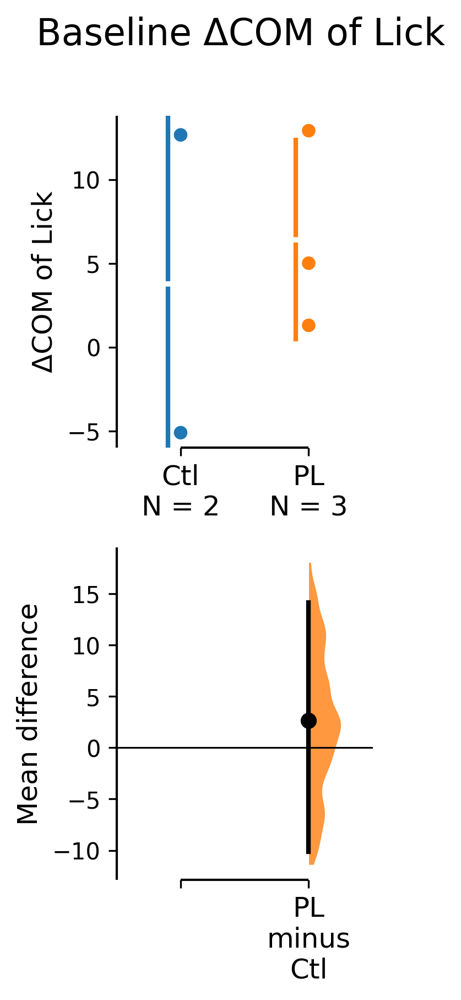

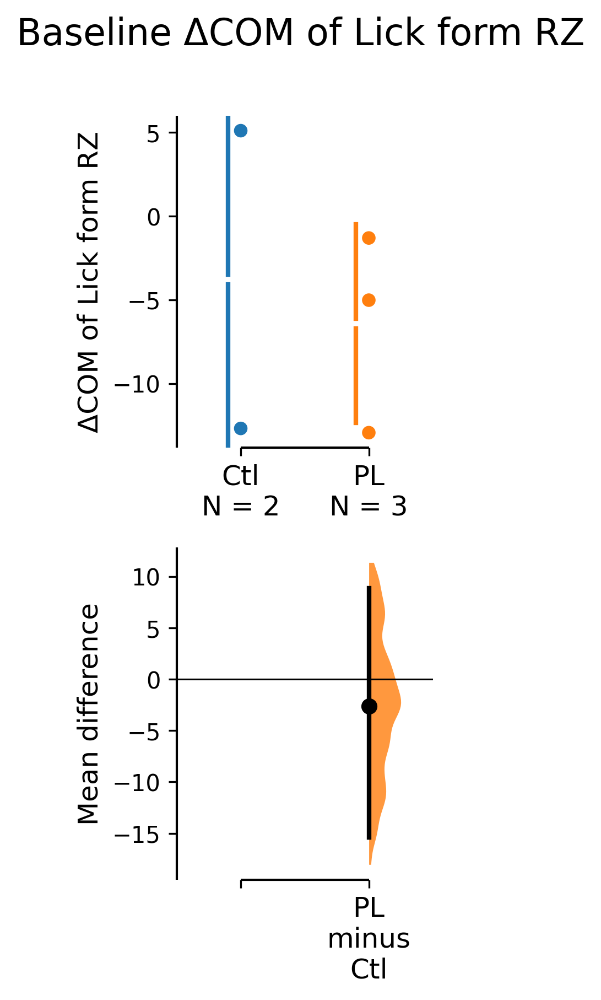

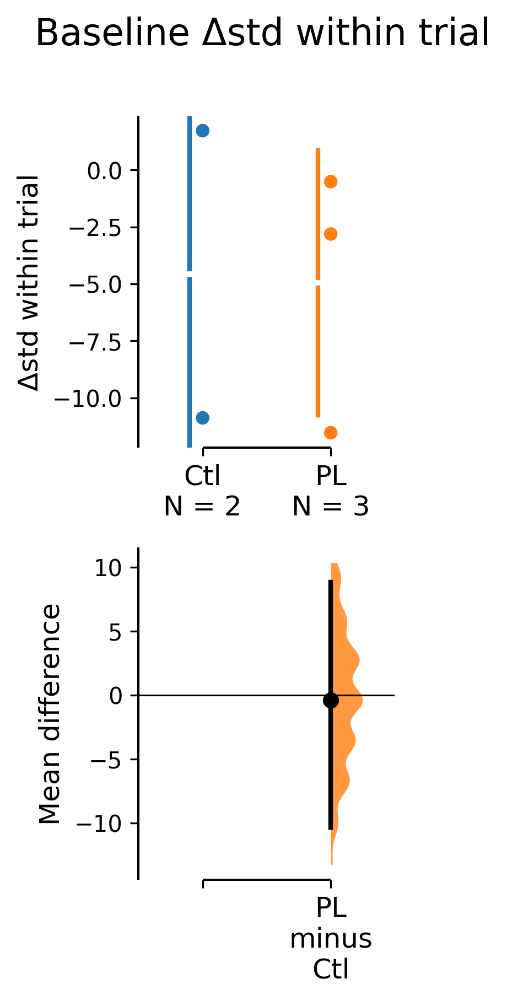

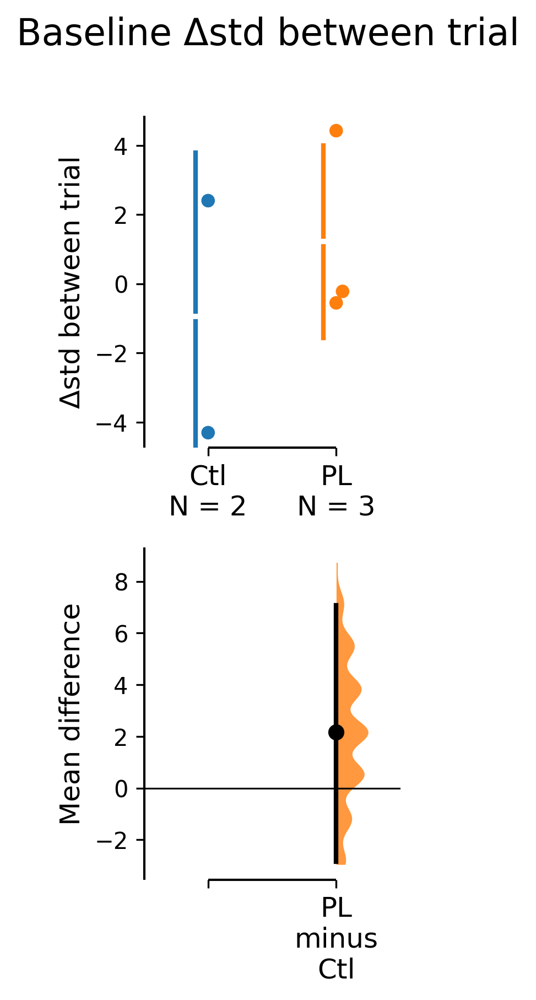

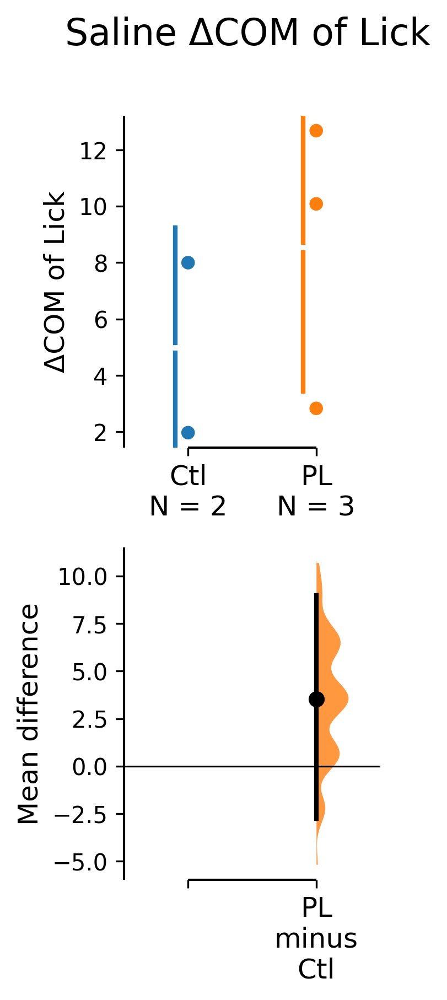

...

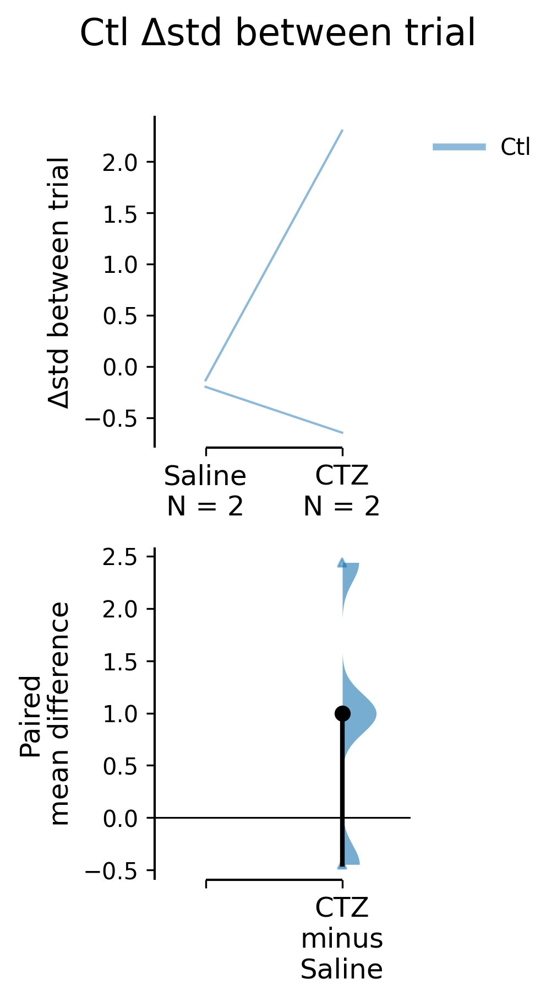

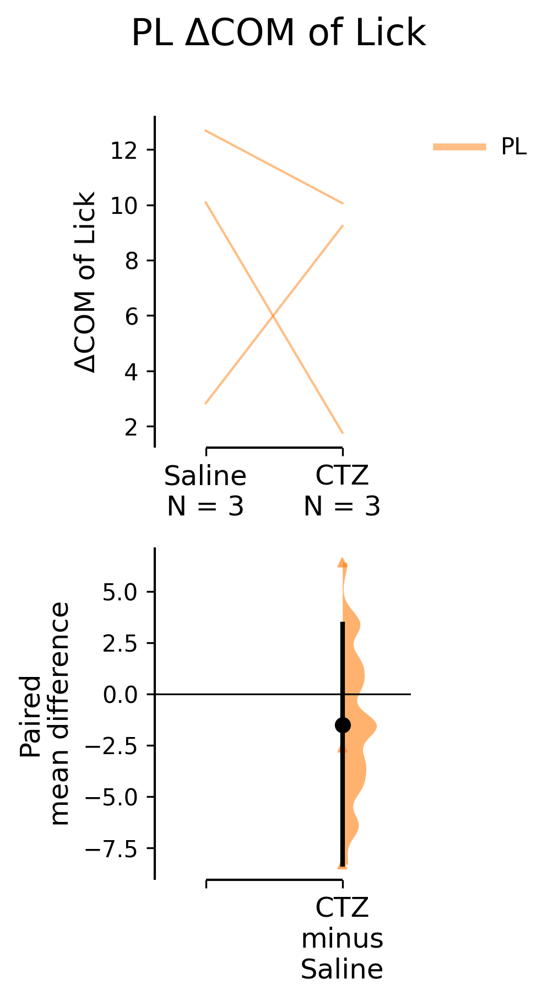

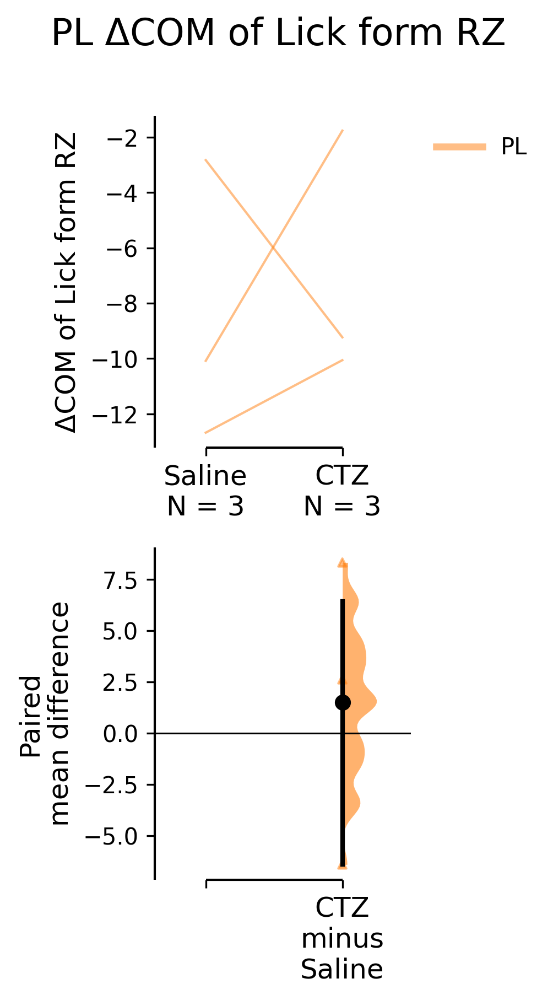

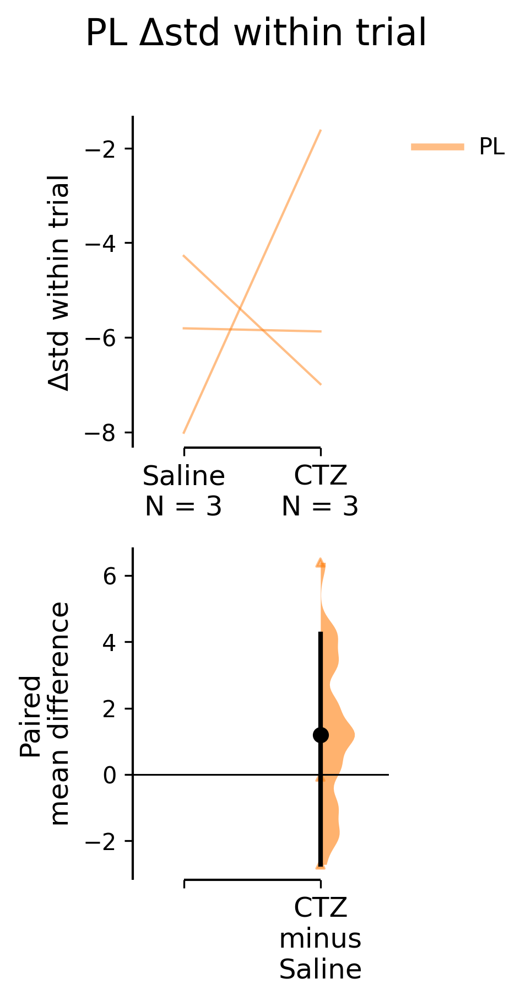

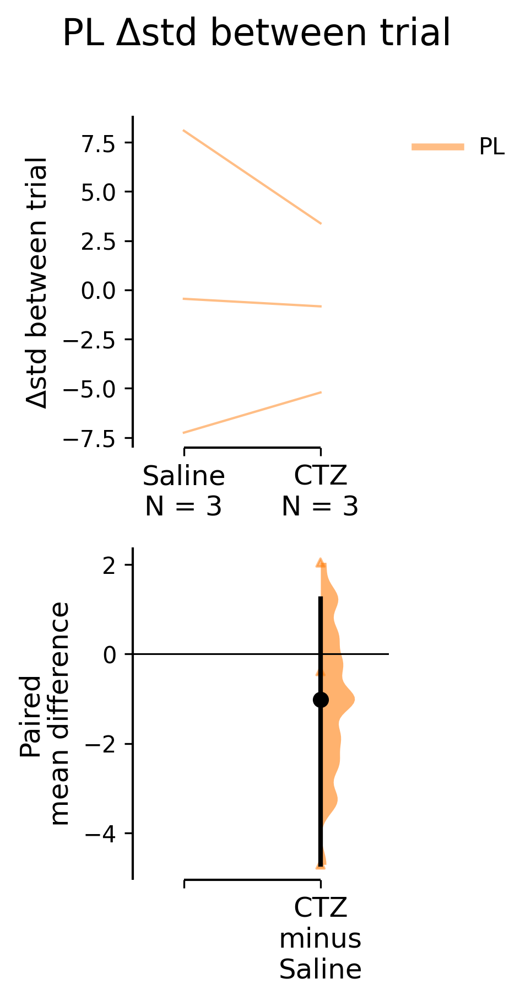

In [34]:
#Analyze and visualize delta stats
ControlTypes = ['Genotype', 'Treatment']
BehaviorParameters = ['ΔCOM of Lick', 'ΔCOM of Lick form RZ', 'Δstd within trial', 'Δstd between trial']

output_dir = "result of ip 20ug"
comparisonses = ["BS",  "SC"]
os.makedirs(output_dir, exist_ok=True)

for ControlType in ControlTypes:

    for comparison in comparisonses:
        if ControlType == 'Genotype':
            if comparison == "BS":
                CondictionNames = ['Baseline', 'Saline']
            elif comparison == "SC":
                CondictionNames = ['Saline', 'CTZ']
        elif ControlType == 'Treatment':
            CondictionNames = ['Ctl', 'PL']
        
        for CondictionName in CondictionNames:

            for BehaviorParameter in BehaviorParameters:
                
                mean_diff, fig = analyze_and_visualize_delta_stats(delta_stats_data, ControlType, CondictionName, BehaviorParameter,  comparison)
                
                # Save the stats and figure to files
                stats_output_path = os.path.join(output_dir, f"{CondictionName}_{BehaviorParameter}_{comparison}_stats.csv")
                mean_diff.to_csv(stats_output_path, index=False)
                fig.savefig(os.path.join(output_dir, f"{CondictionName}_{BehaviorParameter}_{comparison}.png"), dpi=300, bbox_inches='tight')
                print(f"Saved {CondictionName}_{BehaviorParameter}.png and stats to {output_dir}.")

Temp------------------------------

In [7]:
lick_data['Saline', 'PL', '2PL002D'][0]

,lick_position,lick_time,trial
0,32.18,1135.0,0
1,45.33,1569.0,0
2,61.11,2007.0,0
3,74.96,2443.0,0
4,92.34,2967.0,0
...,...,...,...
395,139.68,1073759.0,65
396,143.29,1074037.0,65
397,145.39,1074288.0,65
398,148.35,1074540.0,65


In [10]:
ind_lick_stats_data['Saline', 'PL', '2PL002D'][0]["std_within_trial"]

0     0.465722
1     0.044082
2     0.334910
3     0.294941
4     0.303581
        ...   
61         NaN
62    0.400694
63         NaN
64    0.201096
65    0.157867
Name: coefficient_of_variation_within_trial, Length: 66, dtype: float64

In [8]:
#column1
behavior_csv_data['Saline', 'PL', '2PL002C']

,26,0,0.45,41.1,0.0
0,54,0,1.56,43.53,0.0
1,79,0,2.59,35.80,0.0
2,105,0,3.33,23.24,0.0
3,133,0,3.90,18.71,0.0
4,159,0,4.40,20.14,0.0
...,...,...,...,...,...
36176,1183075,66,151.18,0.00,39.0
36177,1183111,66,151.18,0.00,40.0
36178,1183145,66,151.18,0.00,40.0
36179,1183181,66,151.18,0.00,40.0


In [7]:
s = 'CTZ'
g = 'PL'
m = 'PL004C'
df = behavior_csv_data[s, g, m].copy()
lick_df = lick_data[s, g, m][0].copy()
lick_stats_df = ind_lick_stats_data[s, g, m][0].copy()

# only keep trial 11~30 & 41~60
df = df[(df[df.columns[1]] >= 11) & (df[df.columns[1]] <= 30) | (df[df.columns[1]] >= 41) & (df[df.columns[1]] <= 60)]
lick_df = lick_df[(lick_df['trial'] >= 11) & (lick_df['trial'] <= 30) | (lick_df['trial'] >= 41) & (lick_df['trial'] <= 60)]
lick_stats_df = lick_stats_df[(lick_stats_df['trial'] >= 11) & (lick_stats_df['trial'] <= 30) | (lick_stats_df['trial'] >= 41) & (lick_stats_df['trial'] <= 60)]

In [9]:
import matplotlib.pyplot as plt
import numpy as np

# x-axis: time in minutes
# 視覺化 behavior trace
fig, ax = plt.subplots(figsize=(10, 6), dpi=1200)

# 設置 RZ 底色
ax.axhspan(RZFLOOR, RZCEILING, facecolor='cyan', label='Reward Zone')

# 繪製 RZ 界線
ax.axhline(y=RZFLOOR, color='blue', linestyle='dashed', linewidth=1)
ax.axhline(y=RZCEILING, color='blue', linestyle='dashed', linewidth=1)

# 繪製移動軌跡
plt.scatter(df[df.columns[1]], df[df.columns[2]], color='lightgreen', s=1, label='Trial Track', marker='_')

# 繪製 licking
plt.scatter(lick_df['trial'], lick_df['lick_position'], color='darkblue', s=2, label='Licking', zorder=10)

# 繪製 COM
plt.scatter(lick_stats_df['trial'], lick_stats_df['COM'], color='red', s=10, label='COM')

# 添加兩條線性擬合直線（Trial 11~30 和 Trial 41~60）
for trial_range in [(11, 30), (41, 60)]:
    trial_start, trial_end = trial_range

    # 篩選指定範圍內的數據
    mask = (lick_stats_df['trial'] >= trial_start) & (lick_stats_df['trial'] <= trial_end)
    trial_subset = lick_stats_df[mask]

    # 執行線性擬合
    fit_params = np.polyfit(trial_subset['trial'], trial_subset['COM'], deg=1)
    fit_line = np.polyval(fit_params, trial_subset['trial'])

    # 繪製擬合直線
    trial_center = (trial_start + trial_end) // 2  # 計算中間點
    plt.plot(trial_subset['trial'], fit_line, label=f'Fit Line {trial_start}-{trial_end}', linewidth=2, linestyle='dashed')

# 設置圖形的原點位置
ax.spines['left'].set_position('zero')
ax.spines['bottom'].set_position('zero')

# 圖例
plt.legend(scatterpoints=5, loc='upper right', prop={'size': 8})

FONTSIZE = 16
# 坐標軸標題
plt.title(s , fontsize=FONTSIZE * 2)
plt.xlabel('Trial', fontsize=FONTSIZE)
plt.ylabel('Position (cm)', fontsize=FONTSIZE)

# Axis fontsize
plt.xticks(fontsize=FONTSIZE)
plt.yticks(fontsize=FONTSIZE)

# 設置圖形的軸範圍
ax.set_xlim(left=10, right=61)
ax.set_ylim(0, 200)

# 調整軸線位置以貼齊圖形邊界
ax.spines['left'].set_position(('outward', 0))  # 將 y 軸貼齊左邊
ax.spines['bottom'].set_position(('outward', 0))  # 將 x 軸貼齊底部

# 隱藏右邊和上邊的軸線
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# 確保刻度位於軸線內部
ax.xaxis.set_ticks_position('bottom')
ax.yaxis.set_ticks_position('left')

# 顯示圖形
plt.show()


In [21]:
import matplotlib.pyplot as plt
import numpy as np

# 創建子圖，兩個子圖共享 x 軸
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8), dpi=1200, sharex=True, gridspec_kw={'height_ratios': [1, 3]})

# ---- std Plot ----
# 在上方子圖繪製 std
ax1.scatter(
    lick_stats_df['trial'],
    lick_stats_df['std_within_trial'],
    color='purple',
    s=20,
    label='std (Lick Positions)'
)
ax1.set_ylabel('std', fontsize=14)
ax1.legend(loc='upper right', fontsize=10)
ax1.set_xlim(10, 61)
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.tick_params(axis='both', labelsize=12)

# ---- Main Behavior Plot ----
# 設置 RZ 底色
ax2.axhspan(RZFLOOR, RZCEILING, facecolor='cyan', label='Reward Zone')

# 繪製 RZ 界線
ax2.axhline(y=RZFLOOR, color='blue', linestyle='dashed', linewidth=1)
ax2.axhline(y=RZCEILING, color='blue', linestyle='dashed', linewidth=1)

# 繪製移動軌跡
ax2.scatter(df[df.columns[1]], df[df.columns[2]], color='lightgreen', s=1, label='Trial Track', marker='_')

# 繪製 licking
ax2.scatter(lick_df['trial'], lick_df['lick_position'], color='darkblue', s=2, label='Licking', zorder=10)

# 繪製 COM
ax2.scatter(lick_stats_df['trial'], lick_stats_df['COM'], color='red', s=10, label='COM')

# 添加兩條線性擬合直線（Trial 11~30 和 Trial 41~60）
for trial_range in [(11, 30), (41, 60)]:
    trial_start, trial_end = trial_range

    # 篩選指定範圍內的數據
    mask = (lick_stats_df['trial'] >= trial_start) & (lick_stats_df['trial'] <= trial_end)
    trial_subset = lick_stats_df[mask]

    # 執行線性擬合
    fit_params = np.polyfit(trial_subset['trial'], trial_subset['COM'], deg=1)
    fit_line = np.polyval(fit_params, trial_subset['trial'])

    # 繪製擬合直線
    ax2.plot(trial_subset['trial'], fit_line, label=f'Fit Line {trial_start}-{trial_end}', linewidth=2, linestyle='dashed')

# ---- 設置主圖參數 ----
ax2.set_title(s, fontsize=16)
ax2.set_xlabel('Trial', fontsize=14)
ax2.set_ylabel('Position (cm)', fontsize=14)
ax2.legend(loc='upper right', fontsize=10)
ax2.set_xlim(10, 61)
ax2.set_ylim(0, 200)
ax2.spines['right'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax2.tick_params(axis='both', labelsize=12)

# 調整子圖間距
plt.tight_layout()

# 顯示圖形
plt.show()


In [7]:
import os
import matplotlib.pyplot as plt
from tkinter import Tk, filedialog

# -----------------------------
# 讓使用者選取存檔資料夾
root = Tk()
root.withdraw()  # 隱藏主視窗
save_folder = filedialog.askdirectory(title="選擇儲存圖片的資料夾")
if not save_folder:
    raise Exception("未選擇儲存資料夾，程式中止。")

# -----------------------------
# 假設這三個字典已經被定義並填入資料
# behavior_csv_data = { key: df, ... }
# lick_data = { key: (df, ...), ... }
# ind_lick_stats_data = { key: (df, ...), ... }

# 依序歷遍字典中每一筆資料
for key, df in behavior_csv_data.items():
    # 依照相同 key 從其他資料字典中取得對應的 DataFrame
    lick_df = lick_data[key][0].copy()
    lick_stats_df = ind_lick_stats_data[key][0].copy()
    
    # 創建圖形與座標軸
    fig, ax = plt.subplots(figsize=(10, 6), dpi=300)
    
    # 設置 RZ 底色區域
    ax.axhspan(RZFLOOR, RZCEILING, facecolor='cyan', label='reward zone')
    
    # 繪製 RZ 界線
    ax.axhline(y=RZFLOOR, color='blue', linestyle='dashed', linewidth=1)
    ax.axhline(y=RZCEILING, color='blue', linestyle='dashed', linewidth=1)
    
    # 繪製移動軌跡 (假設第一個欄位是時間，第三個欄位是距離)
    ax.scatter(df[df.columns[0]] / (1000 * 60),
               df[df.columns[2]],
               color='lightgreen', s=1, label='success', marker='_')
    
    # 繪製 licking 軌跡 (假設 lick_df 中有 'lick_time' 與 'lick_position' 欄位)
    ax.scatter(lick_df['lick_time'] / (1000 * 60),
               lick_df['lick_position'],
               color='darkblue', s=2, label='Licking', zorder=10)
    
    # 找到每個 trial 中第一個 lick_position 大於對應 COM 的時間
    # 注意：這裡假設 lick_stats_df 包含 'trial' 與 'COM' 欄位
    # 並且 lick_df 包含 'trial' 與 'lick_time', 'lick_position' 欄位
    filtered_times = (
        lick_df[lick_df['lick_position'] > 
                lick_stats_df.set_index('trial')['COM'].reindex(lick_df['trial']).values]
        .groupby('trial')['lick_time']
        .first()  # 每個 trial 第一個符合條件的 lick_time
    )
    
    # 將結果轉為與 trial 對應的時間列表
    time = lick_stats_df['trial'].map(filtered_times)
    
    # 繪製 COM 點
    ax.scatter(time / (1000 * 60),
               lick_stats_df['COM'],
               color='red', s=10, label='COM')
    
    # 設置圖形的原點位置
    ax.spines['left'].set_position('zero')
    ax.spines['bottom'].set_position('zero')
    
    # 圖例
    ax.legend(scatterpoints=5, loc='upper right', prop={'size': 12})
    
    # 字型大小設定
    FONTSIZE = 16
    ax.set_xlabel('Time (minutes)', fontsize=FONTSIZE)
    ax.set_ylabel('Distance (cm)', fontsize=FONTSIZE)
    
    # 設定標題為該筆資料的 key (轉字串處理)
    ax.set_title(str(key), fontsize=FONTSIZE * 2)
    
    # 設定坐標軸刻度字型大小
    ax.tick_params(axis='both', labelsize=FONTSIZE)
    
    # 設定軸範圍
    ax.set_xlim(left=0)
    ax.set_ylim(0, 200)
    
    # 自動調整圖形版面配置
    plt.tight_layout()
    
    # 以 key 為檔名（若 key 為 tuple 或其他非字串型態，請先轉字串）
    filename = f"{str(key)}.png"
    save_path = os.path.join(save_folder, filename)
    # plt.show()
    plt.savefig(save_path, bbox_inches='tight')
    plt.close(fig)  # 關閉圖形，釋放記憶體

-------------------------------------

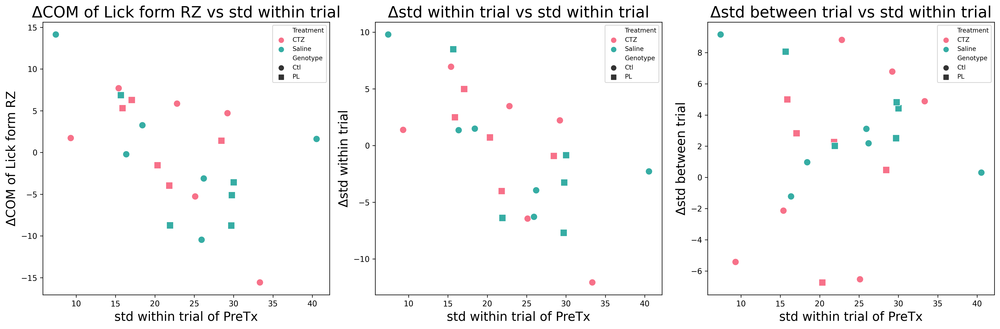

In [9]:
# 選取 group_lick_stats_data 中的 PreTX 資料
pretx_data = group_lick_stats_data[group_lick_stats_data['Tx'] == 'PreTX']

#去掉baseline
pretx_data = pretx_data[pretx_data['Treatment'] != 'Baseline']


# 合併兩個 DataFrame，匹配 mouse_id 和 Treatment
merged_data = delta_stats_data.merge(
    pretx_data, on=['mouse_id', 'Treatment', 'Genotype'], suffixes=('_delta', '_pretx')
)

# 設置行為測量量
behavior_measures = ['ΔCOM of Lick form RZ', 'Δstd within trial', 'Δstd between trial']
pretx_measures = ['std within trial', 'std within trial', 'std within trial']

# 繪製散點圖
import seaborn as sns
import matplotlib.pyplot as plt

# 設置不同基因型的點形狀
markers = {'Ctl': 'o', 'PL': 's'}

# 設置不同處理的顏色
palette = sns.color_palette("husl", len(merged_data['Treatment'].unique()))

# 繪製散點圖
fig, axes = plt.subplots(1, 3, figsize=(18, 6), dpi=300)

for i, (x_col, y_col) in enumerate(zip(pretx_measures, behavior_measures)):
    ax = axes[i]
    
    # 使用 seaborn 繪製散點圖
    sns.scatterplot(
        data=merged_data,
        x=x_col,
        y=y_col,
        hue='Treatment',
        style='Genotype',
        markers=markers,
        palette=palette,
        s=80,
        ax=ax
    )

    ax.set_title(f"{y_col} vs {x_col}", fontsize=20)
    ax.set_xlabel(f"{x_col} of PreTx", fontsize=16)
    ax.set_ylabel(y_col, fontsize=16)
    ax.legend(title="Treatment & Genotype")

    # **調整圖例**
    legend = ax.legend(fontsize=8, title_fontsize=10, loc='upper right')
    legend.get_frame().set_alpha(0.8)  # 設置背景透明度，讓圖例不會太突兀

plt.tight_layout()
plt.show()

---------------------------------------

<Figure size 3600x1800 with 0 Axes>

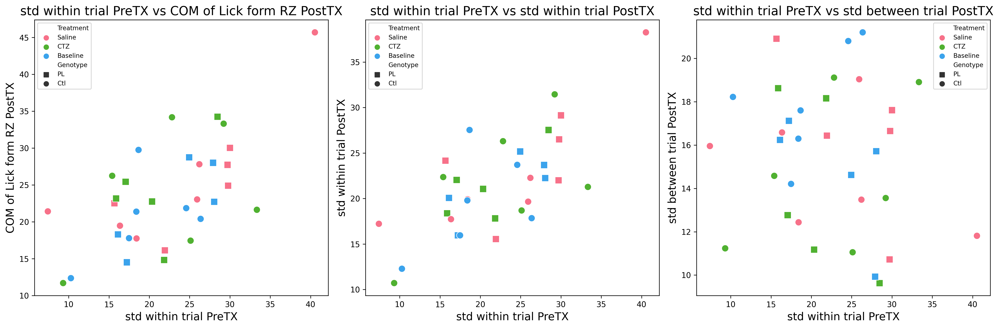

In [8]:
plt.figure(figsize=(12, 6), dpi=300)  # 調整 DPI 以獲得更高解析度

# 選取 group_lick_stats_data 中的 PreTX 和 PostTX 資料
pretx_data = group_lick_stats_data[group_lick_stats_data['Tx'] == 'PreTX']
posttx_data = group_lick_stats_data[group_lick_stats_data['Tx'] == 'PostTX']

# 合併兩個 DataFrame，匹配 mouse_id、Treatment 和 Genotype
merged_data = pretx_data.merge(
    posttx_data, on=['mouse_id', 'Treatment', 'Genotype'], suffixes=('_pretx', '_posttx')
)

# 設置行為測量量
behavior_measures = ['COM of Lick form RZ', 'std within trial', 'std between trial']

# 繪製散點圖
fig, axes = plt.subplots(1, 3, figsize=(18, 6), dpi=300)

for i, measure in enumerate(behavior_measures):
    ax = axes[i]
    
    sns.scatterplot(
        data=merged_data,
        x=f"std within trial_pretx",
        y=f"{measure}_posttx",
        hue='Treatment',
        style='Genotype',
        markers={'Ctl': 'o', 'PL': 's'},
        palette=sns.color_palette("husl", len(merged_data['Treatment'].unique())),
        s=80,
        ax=ax
    )

    # 調整標題和軸標籤的字體大小
    ax.set_title(f"std within trial PreTX vs {measure} PostTX", fontsize=16)  # 標題
    ax.set_xlabel(f"std within trial PreTX", fontsize=14)  # x 軸
    ax.set_ylabel(f"{measure} PostTX", fontsize=14)  # y 軸

    # **調整圖例**
    legend = ax.legend(fontsize=8, title_fontsize=14)
    legend.get_frame().set_alpha(0.8)  # 設置背景透明度，讓圖例不會太突兀

plt.tight_layout()
plt.show()


-------------------------------------------

In [61]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
import matplotlib.lines as mlines

# 選取 group_lick_stats_data 中的 PreTX 資料
pretx_data = group_lick_stats_data[group_lick_stats_data['Tx'] == 'PreTX']

# 去掉 baseline
pretx_data = pretx_data[pretx_data['Treatment'] != 'Baseline']

# 合併兩個 DataFrame，匹配 mouse_id 和 Treatment
merged_data = delta_stats_data.merge(
    pretx_data, on=['mouse_id', 'Treatment', 'Genotype'], suffixes=('_delta', '_pretx')
)

# 設置行為測量量
behavior_measures = ['ΔCOM of Lick form RZ', 'Δstd within trial', 'Δstd between trial']
pretx_measures = ['std within trial', 'std within trial', 'std within trial']

# 設置不同基因型的點形狀
markers = {'Ctl': 'o', 'PL': 's'}
linestyles = {'Ctl': 'solid', 'PL': 'dashed'}
color_Tx = {'Saline': "#35aca4", 'CTZ': '#f67088'}

# 設置不同處理的顏色
palette = sns.color_palette("husl", len(merged_data['Treatment'].unique()))

# 繪製散點圖
fig, axes = plt.subplots(1, 3, figsize=(21, 7), dpi=600)

for i, (x_col, y_col) in enumerate(zip(pretx_measures, behavior_measures)):
    ax = axes[i]
    
    # 使用 seaborn 繪製散點圖
    sns.scatterplot(
        data=merged_data,
        x=x_col,
        y=y_col,
        hue='Treatment',
        style='Genotype',
        markers=markers,
        palette=palette,
        s=80,
        ax=ax,
        legend=False
    )

    # 儲存擬合線圖例
    fit_lines = []
    
    # # 連接相同 mouse_id 的點，使用虛線
    # for mouse in merged_data['mouse_id'].unique():
    #     mouse_data = merged_data[merged_data['mouse_id'] == mouse]
    #     if len(mouse_data) > 1:
    #         ax.plot(mouse_data[x_col], mouse_data[y_col], linestyle='dashed', color='gray', alpha=0.5)
    
    # Fit 直線並計算 R^2
    for genotype in merged_data['Genotype'].unique():
        for treatment in ['Saline', 'CTZ']:
            subset = merged_data[(merged_data['Genotype'] == genotype) & (merged_data['Treatment'] == treatment)]
            if len(subset) > 1:
                X = subset[x_col].values.reshape(-1, 1)
                Y = subset[y_col].values.reshape(-1, 1)
                
                model = LinearRegression()
                model.fit(X, Y)
                Y_pred = model.predict(X)
                r2 = r2_score(Y, Y_pred)

                # **統一 X 軸範圍**
                x_range = np.linspace(merged_data[x_col].min(), merged_data[x_col].max(), 100).reshape(-1, 1)
                y_range = model.predict(x_range)

                # 繪製擬合線
                fit_line, = ax.plot(x_range, y_range, linestyle=linestyles[genotype], color=color_Tx[treatment], 
                        label=f'{genotype} {treatment} (R²={r2:.2f})')
                fit_lines.append(fit_line)

    
    # 在 Y=0 放上淡色直線
    ax.axhline(0, color='gray', linestyle='dotted', alpha=0.6)
    
    ax.set_title(f"{y_col} vs {x_col}", fontsize=20)
    ax.set_xlabel(f"{x_col} of PreTx", fontsize=20)
    ax.set_ylabel(y_col, fontsize=20)
    ax.legend(title="Treatment & Genotype")
    
    # **調整圖例**
    # 手動建立 Treatment 標記圖例
    ctl_legend = mlines.Line2D([], [], color='black', marker='o', linestyle='None', markersize=8, label="Ctl")
    pl_legend = mlines.Line2D([], [], color='black', marker='s', linestyle='None', markersize=8, label="PL")
    legend = ax.legend(fontsize=8, title_fontsize=12, loc='upper right')
    ax.legend(handles=fit_lines + [ctl_legend, pl_legend], fontsize=12, title_fontsize=12, loc='upper right')
    legend.get_frame().set_alpha(0.8)  # 設置背景透明度，讓圖例不會太突兀
    

plt.tight_layout()
plt.show()

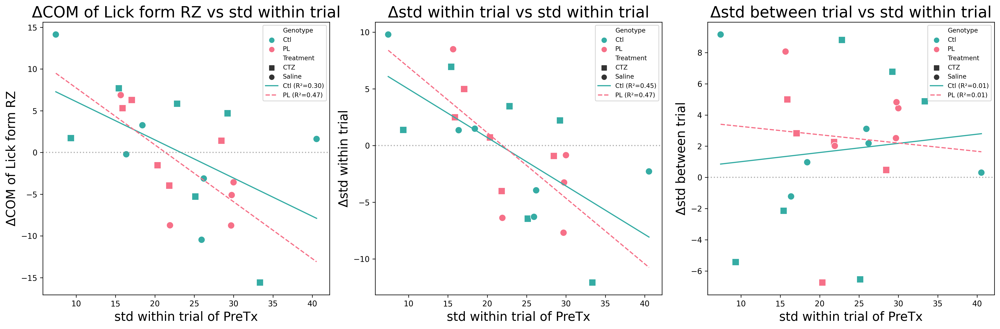

In [49]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

# 選取 group_lick_stats_data 中的 PreTX 資料
pretx_data = group_lick_stats_data[group_lick_stats_data['Tx'] == 'PreTX']

# 去掉 baseline
pretx_data = pretx_data[pretx_data['Treatment'] != 'Baseline']

# 合併兩個 DataFrame，匹配 mouse_id 和 Treatment
merged_data = delta_stats_data.merge(
    pretx_data, on=['mouse_id', 'Treatment', 'Genotype'], suffixes=('_delta', '_pretx')
)

# 設置行為測量量
behavior_measures = ['ΔCOM of Lick form RZ', 'Δstd within trial', 'Δstd between trial']
pretx_measures = ['std within trial', 'std within trial', 'std within trial']

# 設置不同基因型 & 處理方式的區分
genotype_colors = {'Ctl': "#35aca4", 'PL': '#f67088'}  # Control 和 LMO3 用不同顏色
treatment_styles = {'Saline': 'o', 'CTZ': 's'}  # Saline & CTZ 用不同標記
linestyles = {'Ctl': 'solid', 'PL': 'dashed'}  # 不同基因型用不同線條

# 繪製散點圖
fig, axes = plt.subplots(1, 3, figsize=(18, 6), dpi=300)

for i, (x_col, y_col) in enumerate(zip(pretx_measures, behavior_measures)):
    ax = axes[i]
    
    # 使用 seaborn 繪製散點圖
    sns.scatterplot(
        data=merged_data,
        x=x_col,
        y=y_col,
        hue='Genotype',
        style='Treatment',
        palette=genotype_colors,
        markers=treatment_styles,
        s=80,
        ax=ax
    )

    # Fit 兩條線：Control vs LMO3
    for genotype in merged_data['Genotype'].unique():
        subset = merged_data[merged_data['Genotype'] == genotype]
        if len(subset) > 1:
            X = subset[x_col].values.reshape(-1, 1)
            Y = subset[y_col].values.reshape(-1, 1)

            model = LinearRegression()
            model.fit(X, Y)
            r2 = r2_score(Y, model.predict(X))

            # **統一 X 軸範圍**
            x_range = np.linspace(merged_data[x_col].min(), merged_data[x_col].max(), 100).reshape(-1, 1)
            y_range = model.predict(x_range)

            # 繪製擬合線
            ax.plot(x_range, y_range, linestyle=linestyles[genotype], color=genotype_colors[genotype], 
                    label=f'{genotype} (R²={r2:.2f})')

    # 在 Y=0 放上淡色直線
    ax.axhline(0, color='gray', linestyle='dotted', alpha=0.6)
    
    ax.set_title(f"{y_col} vs {x_col}", fontsize=20)
    ax.set_xlabel(f"{x_col} of PreTx", fontsize=16)
    ax.set_ylabel(y_col, fontsize=16)

    # **調整圖例**
    legend = ax.legend(fontsize=8, title_fontsize=10, loc='upper right')
    legend.get_frame().set_alpha(0.8)  # 設置背景透明度，讓圖例不會太突兀

plt.tight_layout()
plt.show()


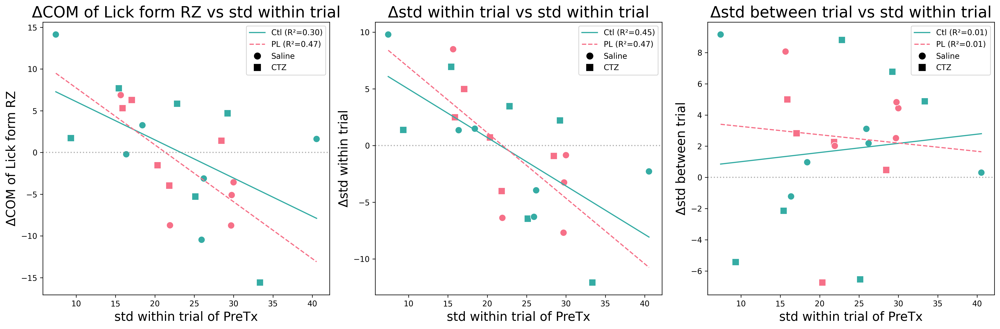

In [52]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
import matplotlib.lines as mlines

# 選取 group_lick_stats_data 中的 PreTX 資料
pretx_data = group_lick_stats_data[group_lick_stats_data['Tx'] == 'PreTX']

# 去掉 baseline
pretx_data = pretx_data[pretx_data['Treatment'] != 'Baseline']

# 合併兩個 DataFrame，匹配 mouse_id 和 Treatment
merged_data = delta_stats_data.merge(
    pretx_data, on=['mouse_id', 'Treatment', 'Genotype'], suffixes=('_delta', '_pretx')
)

# 設置行為測量量
behavior_measures = ['ΔCOM of Lick form RZ', 'Δstd within trial', 'Δstd between trial']
pretx_measures = ['std within trial', 'std within trial', 'std within trial']

# 設置不同基因型 & 處理方式的區分
genotype_colors = {'Ctl': "#35aca4", 'PL': '#f67088'}  # Control 和 LMO3 用不同顏色
treatment_styles = {'Saline': 'o', 'CTZ': 's'}  # Saline & CTZ 用不同標記
linestyles = {'Ctl': 'solid', 'PL': 'dashed'}  # 不同基因型用不同線條

# 繪製散點圖
fig, axes = plt.subplots(1, 3, figsize=(18, 6), dpi=300)

for i, (x_col, y_col) in enumerate(zip(pretx_measures, behavior_measures)):
    ax = axes[i]
    
    # 使用 seaborn 繪製散點圖
    sns.scatterplot(
        data=merged_data,
        x=x_col,
        y=y_col,
        hue='Genotype',  # 仍用 Genotype 設置顏色
        style='Treatment',  # Treatment 用不同標記
        palette=genotype_colors,
        markers=treatment_styles,
        s=80,
        ax=ax,
        legend=False  # 這裡關閉 seaborn 自動產生的圖例
    )

    # 儲存擬合線圖例
    fit_lines = []

    # Fit 兩條線：Control vs LMO3
    for genotype in merged_data['Genotype'].unique():
        subset = merged_data[merged_data['Genotype'] == genotype]
        if len(subset) > 1:
            X = subset[x_col].values.reshape(-1, 1)
            Y = subset[y_col].values.reshape(-1, 1)

            model = LinearRegression()
            model.fit(X, Y)
            r2 = r2_score(Y, model.predict(X))

            # **統一 X 軸範圍**
            x_range = np.linspace(merged_data[x_col].min(), merged_data[x_col].max(), 100).reshape(-1, 1)
            y_range = model.predict(x_range)

            # 繪製擬合線
            fit_line, = ax.plot(x_range, y_range, linestyle=linestyles[genotype], color=genotype_colors[genotype], 
                                label=f'{genotype} (R²={r2:.2f})')
            
            fit_lines.append(fit_line)

    # 在 Y=0 放上淡色直線
    ax.axhline(0, color='gray', linestyle='dotted', alpha=0.6)
    
    ax.set_title(f"{y_col} vs {x_col}", fontsize=20)
    ax.set_xlabel(f"{x_col} of PreTx", fontsize=16)
    ax.set_ylabel(y_col, fontsize=16)

    # 手動建立 Treatment 標記圖例
    saline_legend = mlines.Line2D([], [], color='black', marker='o', linestyle='None', markersize=8, label="Saline")
    ctz_legend = mlines.Line2D([], [], color='black', marker='s', linestyle='None', markersize=8, label="CTZ")

    # **更新圖例**
    ax.legend(handles=fit_lines + [saline_legend, ctz_legend], fontsize=10, title_fontsize=12, loc='upper right')

plt.tight_layout()
plt.show()
